In [3]:
import os
import shutil
import pandas as pd
import pydicom
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import cv2
import numpy as np

In [2]:
# Path to the Excel file containing the MRI coordinates
targeted_bx_path = '/Users/arjunmoorthy/Desktop/Research_Capstone/targeted_biopsy_patients.xlsx'

# Directory containing the DICOM images
dicom_dir_path = '/Users/arjunmoorthy/Desktop/Research_Capstone/ImageData/new_train_data'

# Load the Excel file
targeted_df = pd.read_excel(targeted_bx_path)

In [6]:
dicom_folder = '/Users/arjunmoorthy/Desktop/t2axialimages' #path where dicom images folder is present
seg_folder = '/Users/arjunmoorthy/Desktop/Research_Capstone/ImageData/Prostate-MRI-US-Biopsy' #path where dicom segmentation folder is present

In [14]:
for (root,dirs,files) in os.walk(dicom_folder): #iterate through the dicom folder
    for file in files:
        if file.endswith('.dcm'): #read the first file of each sequence
            patient_name = root.split("/")[5]
            case_df = targeted_df[targeted_df['Patient Number']==patient_name] #Extract details of the corresponding patient
            case_df = case_df.reset_index(drop=True)
            if len(case_df)==0:
                print(f'{patient_name} does not have seriesinstance uid')
                continue
            series_id = case_df['Series Instance UID (MRI)'].values[0] #find the series id of that patient
            ds = pydicom.dcmread(os.path.join(root,file),force=True)
            seriesinstanceuid = ds.SeriesInstanceUID if hasattr(ds, 'SeriesInstanceUID') else None
            print(series_id,seriesinstanceuid,patient_name)
            #if seriesinstanceuid is None:
            #    print(f'{patient_name} does not have seriesinstance uid')
            #    continue
            #if seriesinstanceuid == series_id: #check if series id matches to that of the series id given in the excel file
            #    patient_to_series[patient_name] = root #get the path to which the series id belongs as per the excel file
            #    patient_to_study[patient_name] = ds.StudyInstanceUID #extract its studyinstance uid
            #break #read only the first image

1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 Prostate-MRI-US-Biopsy-1135
1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 Prostate-MRI-US-Biopsy-1135
1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 Prostate-MRI-US-Biopsy-1135
1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 Prostate-MRI-US-Biopsy-1135
1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 Prostate-MRI-US-Biopsy-1135
1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 Prostate-MRI-US-Biopsy-1135
1.3.6.1.4.1.14519.5.2.1.169412160628171690016945684887862817991 

KeyboardInterrupt: 

In [15]:
patient_to_series = {}
patient_to_study = {}

for (root,dirs,files) in os.walk(dicom_folder): #iterate through the dicom folder
    for file in files:
        if file.endswith('.dcm'): #read the first file of each sequence
            patient_name = root.split("/")[5]
            case_df = targeted_df[targeted_df['Patient Number']==patient_name] #Extract details of the corresponding patient
            case_df = case_df.reset_index(drop=True)
            if len(case_df)==0:
                print(f'{patient_name} does not have seriesinstance uid')
                continue
            series_id = case_df['Series Instance UID (MRI)'].values[0] #find the series id of that patient
            ds = pydicom.dcmread(os.path.join(root,file))
            seriesinstanceuid = ds.SeriesInstanceUID if hasattr(ds, 'SeriesInstanceUID') else None
            if seriesinstanceuid is None:
                print(f'{patient_name} does not have seriesinstance uid')
                continue
            if seriesinstanceuid == series_id: #check if series id matches to that of the series id given in the excel file
                patient_to_series[patient_name] = root #get the path to which the series id belongs as per the excel file
                patient_to_study[patient_name] = ds.StudyInstanceUID #extract its studyinstance uid
            break #read only the first image

Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0023 does not have seriesinstance uid
Prostate-MRI-US-Biopsy-0

In [68]:
#patient_to_study['Prostate-MRI-US-Biopsy-0006']='1.3.6.1.4.1.14519.5.2.1.195000579291469847308874110887744310968'

In [17]:
patient_to_study['Prostate-MRI-US-Biopsy-0001']

'1.3.6.1.4.1.14519.5.2.1.85548304921965658367726869399297351743'

In [18]:
path = '/Users/arjunmoorthy/Desktop/Research_Capstone/ImageData/new_train_data'
cancer_path = f'{path}/cancer'
non_cancer_path = f'{path}/non_cancer'
seg_folder = '/Users/arjunmoorthy/Desktop/Research_Capstone/ImageData/Prostate-MRI-US-Biopsy' #path where dicom segmentation folder is present
op_dir = '/Users/arjunmoorthy/Desktop/Research_Capstone/ImageData/new_train_data_segs'

In [35]:
for patient_name in os.listdir(f'{cancer_path}'):
    try:
        for folder in os.listdir(f'{cancer_path}/{patient_name}'):
            if folder =='.DS_Store': continue
            for dcm_files in os.listdir(f'{cancer_path}/{patient_name}/{folder}'):
                if not file.endswith('.dcm'): continue
                study_id = patient_to_study[patient_name]
                dicom_seg_path = f'{seg_folder}/{patient_name}/{study_id}'
                prostate_path = list(filter(lambda x:(x.endswith('prostate.dcm')) & ('surface' not in x),os.listdir(dicom_seg_path)))
                if len(prostate_path)==0:
                    prostate_path = ''
                    prostate_image_path=''
                else:
                    prostate_path = prostate_path[0]
                    prostate_image_path = f'{dicom_seg_path}/{prostate_path}'

                if os.path.exists(prostate_image_path):
                    prostate = pydicom.dcmread(prostate_image_path)
                    prostate_arr = prostate.pixel_array
                    prostate_arr = np.transpose(prostate_arr,(1,2,0)) #transpose to bring the axial axis to last position
                else:
                    continue
                slice_number = int(dcm_files.split('.')[0].split('-')[-1])
                prostate_arr_slice = prostate_arr[...,slice_number-1]
                output_dir_path = f'{op_dir}/cancer/{patient_name}/{folder}'
                os.makedirs(output_dir_path, exist_ok=True)
                cv2.imwrite(f'{output_dir_path}/1-{slice_number}.png',prostate_arr_slice)
    except Exception as e:
        print(f'{patient_name} has issue')

Prostate-MRI-US-Biopsy-0826 has issue
Prostate-MRI-US-Biopsy-0559 has issue
.DS_Store has issue
Prostate-MRI-US-Biopsy-0556 has issue
Prostate-MRI-US-Biopsy-0166 has issue
Prostate-MRI-US-Biopsy-0996 has issue
Prostate-MRI-US-Biopsy-0349 has issue
Prostate-MRI-US-Biopsy-0784 has issue
Prostate-MRI-US-Biopsy-0127 has issue
Prostate-MRI-US-Biopsy-0496 has issue
Prostate-MRI-US-Biopsy-0442 has issue
Prostate-MRI-US-Biopsy-0596 has issue
Prostate-MRI-US-Biopsy-0792 has issue
Prostate-MRI-US-Biopsy-0501 has issue
Prostate-MRI-US-Biopsy-0793 has issue
Prostate-MRI-US-Biopsy-0548 has issue
Prostate-MRI-US-Biopsy-0388 has issue
Prostate-MRI-US-Biopsy-1113 has issue
Prostate-MRI-US-Biopsy-0095 has issue
Prostate-MRI-US-Biopsy-0059 has issue


In [23]:
cancer_path

'/Users/arjunmoorthy/Desktop/Research_Capstone/ImageData/new_train_data/cancer'

In [22]:
for patient_name in os.listdir(f'{cancer_path}'):
    print(patient_name)

Prostate-MRI-US-Biopsy-1135
Prostate-MRI-US-Biopsy-0013
Prostate-MRI-US-Biopsy-0448
Prostate-MRI-US-Biopsy-0828
Prostate-MRI-US-Biopsy-0226
Prostate-MRI-US-Biopsy-0642
Prostate-MRI-US-Biopsy-0470
Prostate-MRI-US-Biopsy-0484
Prostate-MRI-US-Biopsy-1132
Prostate-MRI-US-Biopsy-0817
Prostate-MRI-US-Biopsy-0689
Prostate-MRI-US-Biopsy-0674
Prostate-MRI-US-Biopsy-0446
Prostate-MRI-US-Biopsy-0022
Prostate-MRI-US-Biopsy-0210
Prostate-MRI-US-Biopsy-0821
Prostate-MRI-US-Biopsy-0479
Prostate-MRI-US-Biopsy-0217
Prostate-MRI-US-Biopsy-0819
Prostate-MRI-US-Biopsy-0826
Prostate-MRI-US-Biopsy-0288
Prostate-MRI-US-Biopsy-0886
Prostate-MRI-US-Biopsy-0618
Prostate-MRI-US-Biopsy-0071
Prostate-MRI-US-Biopsy-0627
Prostate-MRI-US-Biopsy-0415
Prostate-MRI-US-Biopsy-0049
Prostate-MRI-US-Biopsy-0412
Prostate-MRI-US-Biopsy-0620
Prostate-MRI-US-Biopsy-0244
Prostate-MRI-US-Biopsy-0076
Prostate-MRI-US-Biopsy-1150
Prostate-MRI-US-Biopsy-0629
Prostate-MRI-US-Biopsy-0040
Prostate-MRI-US-Biopsy-0424
Prostate-MRI-US-Biop

In [41]:
for patient_name in os.listdir(f'{non_cancer_path}'):
    if patient_name =='.DS_Store': continue
    #if not patient_name=='Prostate-MRI-US-Biopsy-0001': continue
    try:
        for folder in os.listdir(f'{non_cancer_path}/{patient_name}'):
            if folder =='.DS_Store': continue
            #print(folder)
            for dcm_files in os.listdir(f'{non_cancer_path}/{patient_name}/{folder}'):
                if not dcm_files.endswith('.dcm'): continue
                study_id = patient_to_study[patient_name]
                dicom_seg_path = f'{seg_folder}/{patient_name}/{study_id}'
                prostate_path = list(filter(lambda x:(x.endswith('prostate.dcm')) & ('surface' not in x),os.listdir(dicom_seg_path)))
                if len(prostate_path)==0:
                    prostate_path = ''
                    prostate_image_path=''
                else:
                    prostate_path = prostate_path[0]
                    prostate_image_path = f'{dicom_seg_path}/{prostate_path}'

                if os.path.exists(prostate_image_path):
                    prostate = pydicom.dcmread(prostate_image_path)
                    prostate_arr = prostate.pixel_array
                    prostate_arr = np.transpose(prostate_arr,(1,2,0)) #transpose to bring the axial axis to last position
                else:
                    continue
                slice_number = int(dcm_files.split('.')[0].split('-')[-1])
                prostate_arr_slice = prostate_arr[...,slice_number-1]
                #print(prostate_arr_slice.shape)
                output_dir_path = f'{op_dir}/non_cancer/{patient_name}/{folder}'
                os.makedirs(output_dir_path, exist_ok=True)
                cv2.imwrite(f'{output_dir_path}/1-{slice_number}.png',prostate_arr_slice.astype('uint8'))
    except Exception as e:
        print(f'{patient_name} has issue')

Prostate-MRI-US-Biopsy-0826 has issue
Prostate-MRI-US-Biopsy-0559 has issue
Prostate-MRI-US-Biopsy-0534 has issue
Prostate-MRI-US-Biopsy-0166 has issue
Prostate-MRI-US-Biopsy-0996 has issue
Prostate-MRI-US-Biopsy-0349 has issue
Prostate-MRI-US-Biopsy-0784 has issue
Prostate-MRI-US-Biopsy-0370 has issue
Prostate-MRI-US-Biopsy-0127 has issue
Prostate-MRI-US-Biopsy-0496 has issue
Prostate-MRI-US-Biopsy-0442 has issue
Prostate-MRI-US-Biopsy-0883 has issue
Prostate-MRI-US-Biopsy-0596 has issue
Prostate-MRI-US-Biopsy-0792 has issue
Prostate-MRI-US-Biopsy-0793 has issue
Prostate-MRI-US-Biopsy-1003 has issue
Prostate-MRI-US-Biopsy-0548 has issue
Prostate-MRI-US-Biopsy-0388 has issue
Prostate-MRI-US-Biopsy-1113 has issue
Prostate-MRI-US-Biopsy-0095 has issue
Prostate-MRI-US-Biopsy-0059 has issue


In [16]:
img_path = '/Users/arjunmoorthy/Desktop/Research_Capstone/ImageData/new_train_data/non_cancer/Prostate-MRI-US-Biopsy-0001/biopsy_5_non_cancer/1-33.dcm'
label_path = '/Users/arjunmoorthy/Desktop/Research_Capstone/ImageData/new_train_data_segs/non_cancer/Prostate-MRI-US-Biopsy-0001/biopsy_5_non_cancer/1-33.png'

In [17]:
img = pydicom.dcmread(img_path)
label = cv2.imread(label_path)
label = label[...,0]

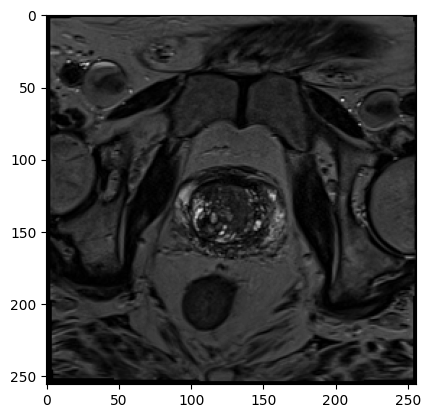

In [18]:
plt.imshow(img.pixel_array,cmap='gray')

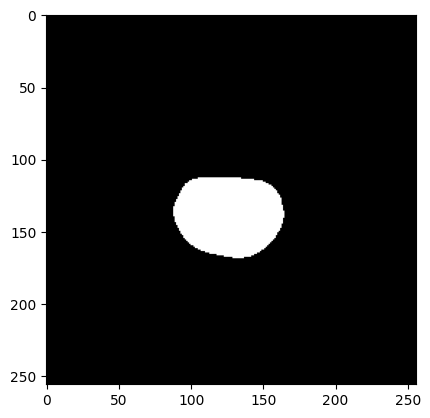

In [19]:
plt.imshow(label,cmap='gray')